In [1]:
import sys
import os
from typing import Optional
from tqdm import tqdm
sys.path.append(os.path.abspath('../'))

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import seaborn as sns
import os
from IPython.display import display, HTML

from utils import *
from utils.plot_utils import *

pd.set_option('display.max_rows', 500)

In [2]:

def cw_condition(y_diffs, cw=0.5, mon=-0.3):
    has_large_jump = np.any(y_diffs > cw)
    is_monotonic = np.all(y_diffs >= mon)
    return has_large_jump and is_monotonic

names_to_labels={
    'truthfulqa-truthful_qa':"TruthfulQA", 
    'cais-mmlu':"MMLU", 
    'allenai-ai2_arc-ARC-Easy':"ARC Easy", 
    'lucasmccabe-logiqa':"LogiQA", 
    'allenai-ai2_arc-ARC-Challenge':"ARC Challenge", 
    'competition_math' : "MATH", 
    'deepmind-aqua_rat' : "AQUA-RAT"
    
}

date = "12-07-2024"

def tail_included(tail):
    return "split=test" in tail or "split=validation" in tail
    
os.makedirs(f"{date}-cot-diagrams",exist_ok=True)

## CoT over 10k points

It isimportant to note that for the results are sensitive to whether we filter for NANs, i.e. directly asking early one on the MATH dataset tends to results in NaN values

In [3]:
base_dir = "/n/holylabs/LABS/sitanc_lab/Users/mfli/critical-windows-lm/results/QANoiseDenoise"
datasets = [d for d in os.listdir(base_dir) if d.startswith("QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=") and d.endswith("nsamples=10000_num_per_noise=1") and tail_included(d)]
print(datasets)

real_dataset_names = [d.split("_dataset=")[1].split("_split=")[0] for d in datasets]
dataset_names = [names_to_labels[real_name] for real_name in real_dataset_names]
print(real_dataset_names)
print(dataset_names)

['QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=allenai-ai2_arc-ARC-Challenge_split=test_nsamples=10000_num_per_noise=1', 'QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=truthfulqa-truthful_qa_split=validation_nsamples=10000_num_per_noise=1', 'QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=deepmind-aqua_rat_split=test_nsamples=10000_num_per_noise=1', 'QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=lucasmccabe-logiqa_split=test_nsamples=10000_num_per_noise=1', 'QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=cais-mmlu_split=test_nsamples=10000_num_per_noise=1', 'QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=competition_math_split=test_nsamples=10000_num_per_noise=1', 'QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=allenai-ai2_arc-ARC-Easy_split=test_nsamples=10000_num_per_noise=1']
['allenai-ai2_arc-ARC-Challenge', 'truthfulqa-truthful_qa', 'deepmind-aqua_rat', 'lucasmccabe-logiqa',

In [4]:
combined_df = load_df_across_dirs(datasets , dataset_names,  base_dir)
print(len(combined_df.no_deno_string_ans.unique()))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:08<00:00,  1.26s/it]


Before dropping NA for formatted_answer : length = 121620
After dropping NA for formatted_answer : length = 121224
121041


,0.05,0.1,0.3,0.5,0.7,0.9,orig_is_right
dataset_source,,,,,,,
AQUA-RAT,0.700787,0.625984,0.657480,0.645669,0.665354,0.661417,0.669291
ARC Challenge,0.869454,0.866894,0.865188,0.852389,0.854096,0.861775,0.860068
ARC Easy,0.940657,0.948653,0.945707,0.950337,0.942761,0.948653,0.948653
LogiQA,0.440860,0.443932,0.428571,0.431644,0.443932,0.447005,0.450077
MATH,0.477503,0.471423,0.477706,0.472233,0.476287,0.477098,0.475882
MMLU,0.705900,0.714900,0.704500,0.708000,0.704600,0.704700,0.702776
TruthfulQA,0.689106,0.675643,0.675643,0.652387,0.669523,0.658507,0.657283


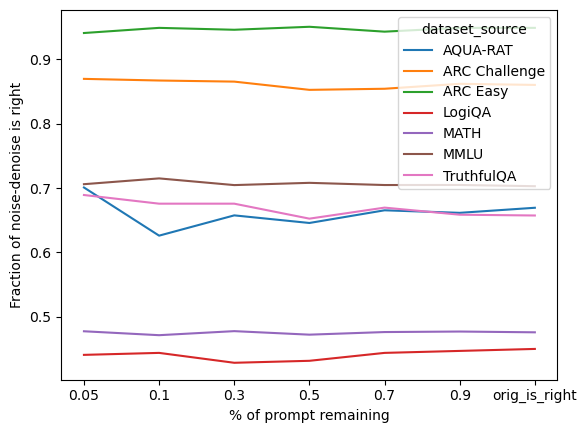

In [5]:
display(display_then_plot(combined_df, "is_right","orig_is_right","Fraction of noise-denoise is right"))

,0.05,0.1,0.3,0.5,0.7,0.9,orig_is_right
dataset_source,,,,,,,
AQUA-RAT,0.114173,0.157480,0.311024,0.374016,0.374016,0.433071,0.669291
ARC Challenge,0.517918,0.738908,0.832765,0.835324,0.835324,0.857509,0.860068
ARC Easy,0.526094,0.816077,0.937290,0.941077,0.942340,0.946970,0.948653
LogiQA,0.408602,0.447005,0.466974,0.457757,0.434716,0.450077,0.450077
MATH,0.092015,0.116944,0.149777,0.170045,0.220105,0.375963,0.475882
MMLU,0.495800,0.632200,0.680700,0.681900,0.685800,0.701200,0.702776
TruthfulQA,0.580171,0.610771,0.647491,0.640147,0.641371,0.653611,0.657283


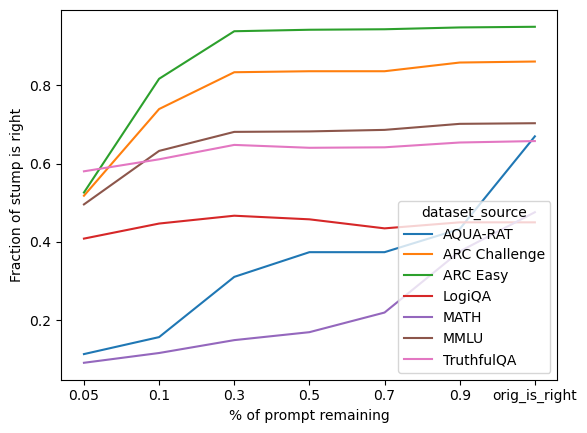

In [6]:
display(display_then_plot(combined_df, "stump_is_right","orig_is_right","Fraction of stump is right"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.700787,0.700787,0.787402,0.771654,0.846457,0.877953
ARC Challenge,0.890785,0.889932,0.898464,0.928328,0.959044,0.978669
ARC Easy,0.945707,0.953283,0.954966,0.968855,0.978535,0.992003
LogiQA,0.552995,0.559140,0.592934,0.689708,0.803379,0.890937
MATH,0.448318,0.459668,0.515606,0.581070,0.662546,0.788812
MMLU,0.744800,0.761500,0.805600,0.855800,0.901200,0.952100
TruthfulQA,0.722154,0.728274,0.795594,0.820073,0.883721,0.927785


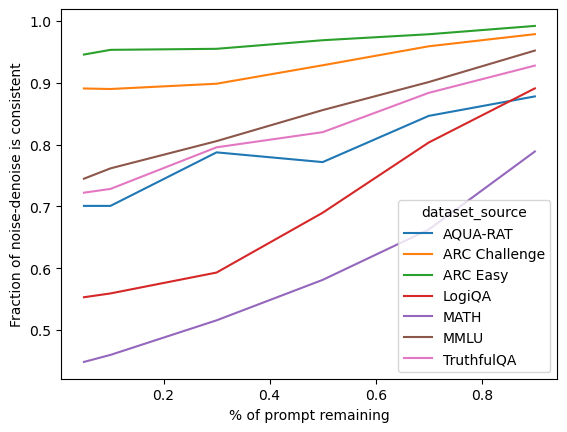

In [7]:
display(display_then_plot(combined_df, "is_consistent",None,"Fraction of noise-denoise is consistent"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.125984,0.240157,0.397638,0.480315,0.511811,0.610236
ARC Challenge,0.529010,0.767065,0.868601,0.893345,0.925768,0.965017
ARC Easy,0.528199,0.826178,0.950758,0.961279,0.969276,0.988636
LogiQA,0.522273,0.572965,0.591398,0.652842,0.754224,0.849462
MATH,0.127888,0.150993,0.201257,0.236927,0.328131,0.586745
MMLU,0.531500,0.677200,0.752700,0.788500,0.837100,0.910800
TruthfulQA,0.660955,0.709914,0.757650,0.795594,0.851897,0.914321


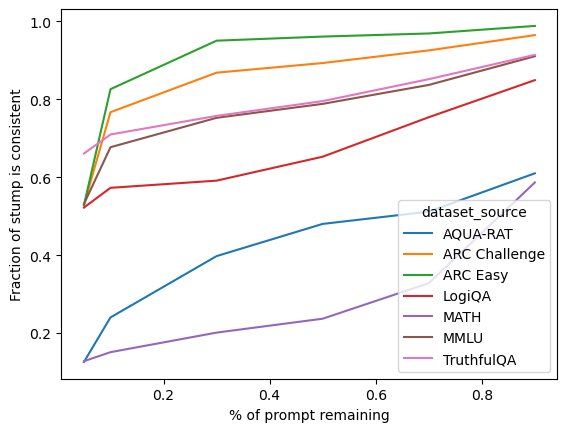

In [8]:
display(display_then_plot(combined_df, "stump_is_consistent",None,"Fraction of stump is consistent"))

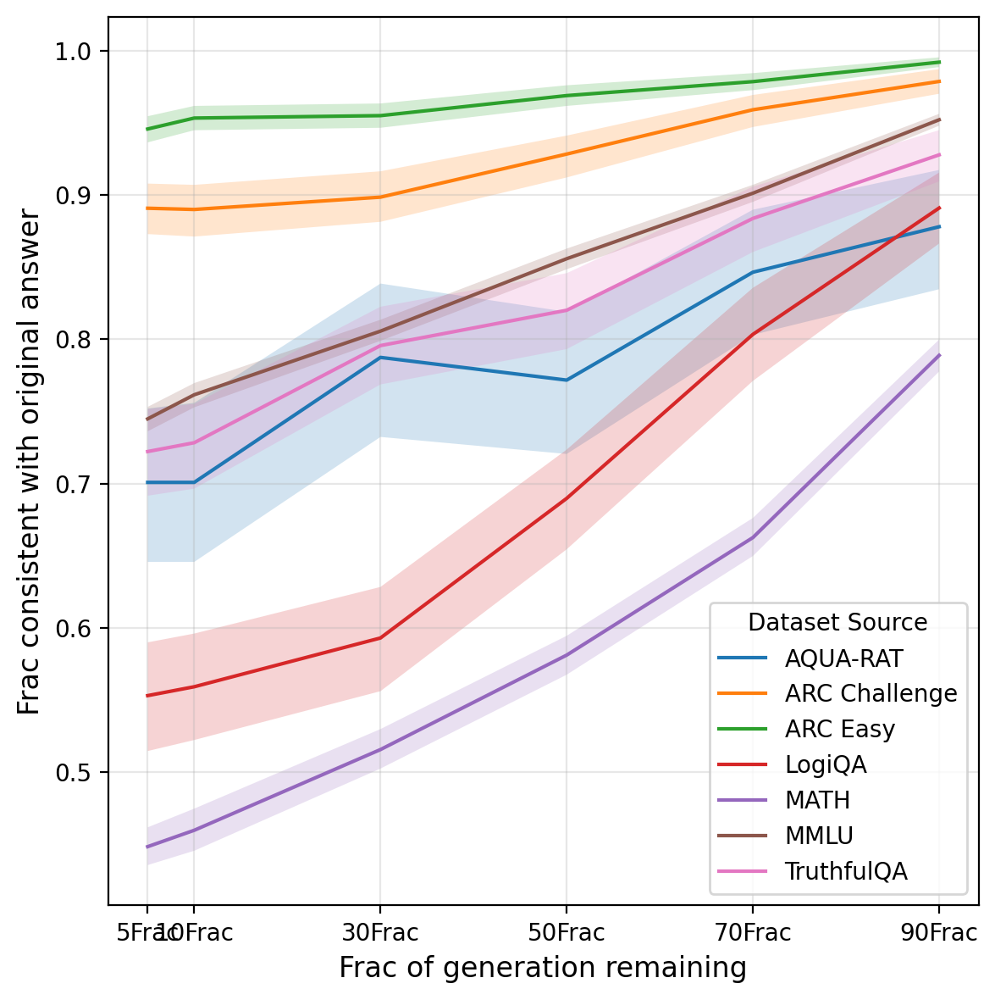

In [9]:
# Preparing data for plotting
plot_data = []
for (dataset_source, stop_frac), group in combined_df.groupby(["dataset_source", "stop_frac"]):
    mean, lower, upper = compute_ci(group["is_consistent"])
    plot_data.append({
        "dataset_source": dataset_source,
        "stop_frac": stop_frac,
        "mean": mean,
        "ci_lower": lower,
        "ci_upper": upper
    })

# Convert to DataFrame
plot_df = pd.DataFrame(plot_data)

# Create the plot
plt.figure(figsize=(6, 6),dpi=200)
for dataset in plot_df["dataset_source"].unique():
    data = plot_df[plot_df["dataset_source"] == dataset]
    plt.plot(data["stop_frac"], data["mean"], label=dataset)
    plt.fill_between(data["stop_frac"], data["ci_lower"], data["ci_upper"], alpha=0.2)

# Customize plot
plt.xlabel("Frac of generation remaining", fontsize=12)
plt.ylabel("Frac consistent with original answer", fontsize=12)
plt.xticks(plot_df["stop_frac"].unique(), labels=[f"{int(x*100)}Frac" for x in plot_df["stop_frac"].unique()])
plt.legend(title="Dataset Source")
plt.grid(alpha=0.3)
plt.tight_layout()

# Show plot
plt.show()

Text(0.5, 1.0, 'Other Datasets')

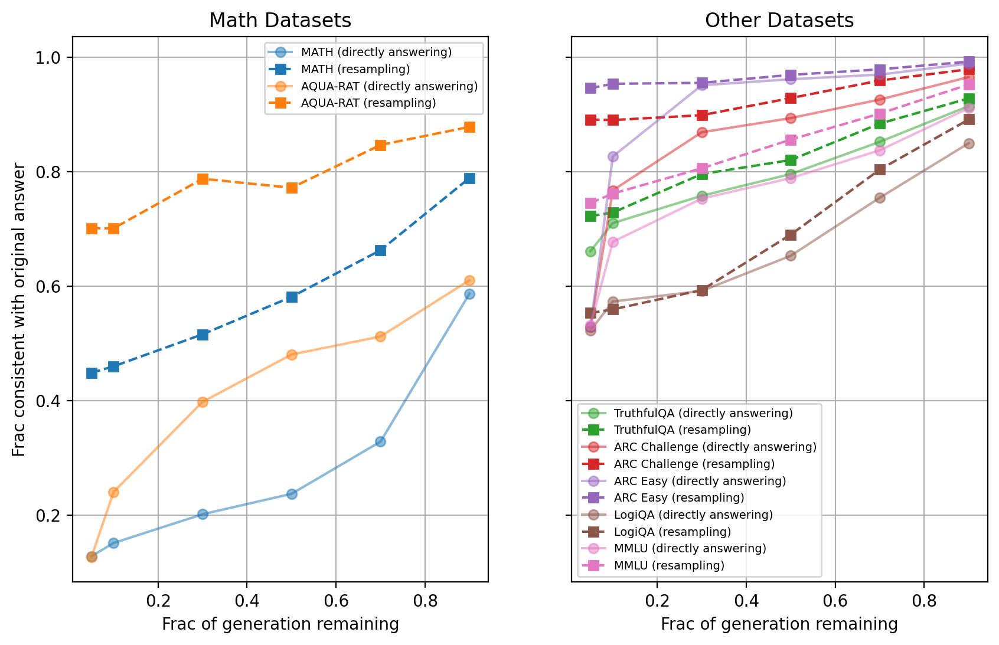

In [10]:
# Compute the means grouped by dataset_source and stop_frac
stump_means = (combined_df
               .groupby(["dataset_source", "stop_frac"])["stump_is_consistent"]
               .mean()
               .reset_index())

not_stump_means = (combined_df
                   .groupby(["dataset_source", "stop_frac"])["is_consistent"]
                   .mean()
                   .reset_index())

# Merge the two datasets for easier plotting of arrows
merged_means = pd.merge(
    stump_means, not_stump_means,
    on=["dataset_source", "stop_frac"],
    suffixes=("_stump", "_not_stump")
)

# Set up the plot
fig, axs = plt.subplots(1,2,figsize=(10, 6), sharey='row',dpi=200)

# Assign colors for each dataset_source
colors = plt.cm.tab10(range(len(merged_means["dataset_source"].unique())))

# Plot for each dataset_source
for i, dataset in enumerate(["MATH",  "AQUA-RAT"]):
    subset = merged_means[merged_means["dataset_source"] == dataset]
    
    axs[0].plot(subset["stop_frac"], subset["stump_is_consistent"],alpha=0.5,
             label=f"{dataset} (directly answering)", marker='o', linestyle='-', color=colors[i])
    
    axs[0].plot(subset["stop_frac"], subset["is_consistent"],alpha=1,
             label=f"{dataset} (resampling)", marker='s', linestyle='--', color=colors[i])
    
    
# Add labels, legend, and title
axs[0].set_xlabel("Frac of generation remaining")
axs[0].set_ylabel("Frac consistent with original answer")
axs[0].set_title("Math Datasets")
axs[0].legend(fontsize=7)
axs[0].grid(True)

# Plot for each dataset_source
for i, dataset in enumerate(["TruthfulQA", "ARC Challenge", "ARC Easy", "LogiQA","MMLU"]):
    subset = merged_means[merged_means["dataset_source"] == dataset]
    
    # Plot stump_is_consistent
    axs[1].plot(subset["stop_frac"], subset["stump_is_consistent"],alpha=0.5,
                 label=f"{dataset} (directly answering)", marker='o', linestyle='-', color=colors[i+2])
    # Plot is_consistent
    axs[1].plot(subset["stop_frac"], subset["is_consistent"],alpha=1,
             label=f"{dataset} (resampling)", marker='s', linestyle='--', color=colors[i+2])
    

# Add labels, legend, and title
axs[1].set_xlabel("Frac of generation remaining")
axs[1].grid(True)
axs[1].legend(fontsize=7)
axs[1].set_title("Other Datasets")


In [11]:
print(combined_df.loc[combined_df.dataset_source=="AQUA-RAT",["orig_string_ans"]].sample(1).iloc[0].values)

['<|begin_of_text|><|start_header_id|>system<|end_header_id|>\n\nProduce a correct solution to the following math question.<|eot_id|><|start_header_id|>user<|end_header_id|>\n\nSuppose you want to arrange your English, Hindi, Mathematics, History, Geography and Science books on a shelf. In how many ways can you do it?\n A)520\n B)720\n C)920\n D)None\n E)Cannot be determined\n\n\nThink of the math question thoroughly step by step.     Please only respond with the answer after reasoning thoroughly. \n\n<|eot_id|><|start_header_id|>assistant<|end_header_id|>\n\nLet\'s think step by step:  We have 6 books to arrange on a shelf. \n\nStep 1: First, we can choose any one of the 6 books to place on the shelf. This can be done in 6 ways.\n\nStep 2: Once the first book is placed, there are 5 remaining books to be arranged. These can be arranged in 5! (5 factorial) ways, which is equal to 5 x 4 x 3 x 2 x 1 = 120 ways.\n\nStep 3: Now, we need to multiply the number of ways to place the first book

In [12]:
print(combined_df.loc[combined_df.dataset_source=="AQUA-RAT",["stump_string_ans"]].sample(1).iloc[0].values)

['<|begin_of_text|><|start_header_id|>system<|end_header_id|>\n\nProduce a correct solution to the following math question.<|eot_id|><|start_header_id|>user<|end_header_id|>\n\nThe greatest common factor of two positive integers is 11. The least common multiple of these two integers is 7700. If one of the integers is 350, what is the other?\n A)242\n B)308\n C)352\n D)412\n E)456\n\n\nThink of the math question thoroughly step by step.     Please only respond with the answer after reasoning thoroughly. \n\n<|eot_id|><|start_header_id|>assistant<|end_header_id|>\n\n\n\nLet\'s think step by step:  We know that the<|eot_id|><|start_header_id|>user<|end_header_id|>\n\nGiven all of the above, what’s the single, most likely answer? Your answer should have the format "The answer is ANSWER", where ANSWER is your answer. \n\n<|eot_id|><|start_header_id|>assistant<|end_header_id|>\n\nThe product of two numbers is equal to the product of their greatest common factor (GCF) and least common multipl

## Conditioning on correctness 

Doesn't seem to be that meaningful because ``is_right`` only affects ``is_consistent`` through ``orig_is_right``?

In [13]:
correlations = pd.DataFrame(combined_df
                .groupby(["dataset_source", "stop_frac"])
                .apply(lambda x: x["is_right"].corr(x["is_consistent"]))
)

# Display the results
display(correlations)

/tmp/ipykernel_1510331/4143215539.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x["is_right"].corr(x["is_consistent"]))


0
dataset_source stop_frac          
AQUA-RAT       0.05       0.436724
               0.10       0.507738
               0.30       0.375205
               0.50       0.420583
               0.70       0.345968
               0.90       0.292377
ARC Challenge  0.05       0.416460
               0.10       0.407940
               0.30       0.404958
               0.50       0.387943
               0.70       0.304852
               0.90       0.180417
ARC Easy       0.05       0.576594
               0.10       0.517789
               0.30       0.521188
               0.50       0.416269
               0.70       0.438557
               0.90       0.214631
LogiQA         0.05       0.244499
               0.10       0.270310
               0.30       0.212110
               0.50       0.215812
               0.70       0.177542
               0.90       0.146069
MATH           0.05       0.640283
               0.10       0.641818
               0.30       0.590836
               0.50       0.554683
               0.70       0.502081
               0.90       0.406755
MMLU           0.05       0.421080
               0.10       0.385158
               0.30       0.361398
               0.50       0.294839
               0.70       0.255003
               0.90       0.166858
TruthfulQA     0.05       0.374444
               0.10       0.411384
               0.30       0.303641
               0.50       0.333896
               0.70       0.232195
               0.90       0.197957

## Per example COT

In [14]:
base_dir = "/n/holylabs/LABS/sitanc_lab/Users/mfli/critical-windows-lm/results/QANoiseDenoise"
datasets = [d for d in os.listdir(base_dir) if d.startswith("QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=") and d.endswith("_nsamples=400_num_per_noise=25") and tail_included(d)]
print(datasets)

real_dataset_names = [d.split("_dataset=")[1].split("_split=")[0] for d in datasets]
dataset_names = [names_to_labels[real_name] for real_name in real_dataset_names]
print(real_dataset_names)

print(dataset_names)

['QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=allenai-ai2_arc-ARC-Easy_split=test_nsamples=400_num_per_noise=25', 'QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=cais-mmlu_split=test_nsamples=400_num_per_noise=25', 'QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=truthfulqa-truthful_qa_split=validation_nsamples=400_num_per_noise=25', 'QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=competition_math_split=test_nsamples=400_num_per_noise=25', 'QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=allenai-ai2_arc-ARC-Challenge_split=test_nsamples=400_num_per_noise=25', 'QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=deepmind-aqua_rat_split=test_nsamples=400_num_per_noise=25', 'QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=lucasmccabe-logiqa_split=test_nsamples=400_num_per_noise=25']
['allenai-ai2_arc-ARC-Easy', 'cais-mmlu', 'truthfulqa-truthful_qa', 'competition_math', 'allenai-ai2_arc-ARC-

In [15]:
combined_df = load_df_across_dirs(datasets , dataset_names,  base_dir)
print(len(combined_df.no_deno_string_ans.unique()))
display(combined_df[["dataset_source","no_deno_string_ans"]].drop_duplicates().groupby("dataset_source")["no_deno_string_ans"].count())
display(combined_df[["stop_frac","no_deno_string_ans"]].drop_duplicates().groupby("stop_frac")["no_deno_string_ans"].count())
display(combined_df.head())

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:24<00:00,  3.45s/it]


Before dropping NA for formatted_answer : length = 398100
After dropping NA for formatted_answer : length = 396750
366890


dataset_source
AQUA-RAT         33121
ARC Challenge    56561
ARC Easy         56463
LogiQA           56822
MATH             51896
MMLU             55989
TruthfulQA       56038
Name: no_deno_string_ans, dtype: int64

stop_frac
0.05    66078
0.10    66037
0.30    65456
0.50    64451
0.70    62145
0.90    43608
Name: no_deno_string_ans, dtype: int64

,problem,formatted_answer,stop_frac,no,orig_ans_string,orig_ans_format,stump_ans_string,stump_ans_format,no_deno_ans_format,no_deno_ans_string,is_consistent,is_right,orig_is_right,stump_is_right,is_stump,stump_is_consistent,stump_string_ans,no_deno_string_ans,orig_string_ans,dataset_source
0,Which of the following is a description of an ...,(C),0.05,0,The answer is C.,(C),The answer is C.,(C),(C),The answer is C.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,ARC Easy
1,Which of the following is a description of an ...,(C),0.05,1,The answer is C.,(C),The answer is C.,(C),(C),The answer is C.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,ARC Easy
2,Which of the following is a description of an ...,(C),0.05,2,The answer is C.,(C),The answer is C.,(C),(C),The answer is C.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,ARC Easy
3,Which of the following is a description of an ...,(C),0.05,3,The answer is C.,(C),The answer is C.,(C),(C),The answer is C.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,ARC Easy
4,Which of the following is a description of an ...,(C),0.05,4,The answer is C.,(C),The answer is C.,(C),(C),The answer is C.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,ARC Easy


stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.666457,0.650866,0.649449,0.650236,0.669921,0.662047
ARC Challenge,0.878500,0.875700,0.875200,0.880400,0.875600,0.881100
ARC Easy,0.944200,0.945200,0.942200,0.938300,0.935000,0.934000
LogiQA,0.424900,0.429100,0.422300,0.428500,0.424700,0.437400
MATH,0.455345,0.450332,0.444399,0.449821,0.466701,0.474066
MMLU,0.728700,0.725700,0.736400,0.717400,0.711100,0.711200
TruthfulQA,0.688800,0.686900,0.676800,0.681100,0.686500,0.680900


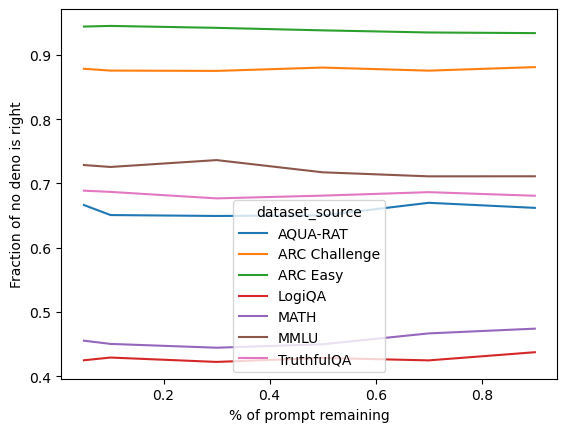

In [16]:
display(display_then_plot(combined_df, "is_right",None,"Fraction of no deno is right"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.114173,0.15748,0.311024,0.374016,0.374016,0.433071
ARC Challenge,0.510000,0.73750,0.815000,0.820000,0.847500,0.870000
ARC Easy,0.537500,0.82250,0.930000,0.930000,0.932500,0.937500
LogiQA,0.385000,0.42750,0.437500,0.440000,0.425000,0.430000
MATH,0.099744,0.12532,0.122762,0.127877,0.194373,0.350384
MMLU,0.505000,0.66000,0.695000,0.687500,0.690000,0.697500
TruthfulQA,0.615000,0.62750,0.652500,0.657500,0.650000,0.662500


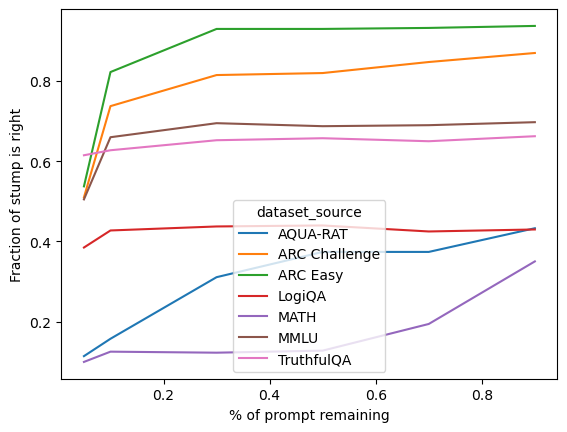

In [17]:
display(display_then_plot(combined_df, "stump_is_right",None,"Fraction of stump is right"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.696535,0.705827,0.760630,0.787874,0.836378,0.877795
ARC Challenge,0.887900,0.901400,0.918100,0.941400,0.964500,0.980400
ARC Easy,0.950700,0.949800,0.953500,0.973000,0.977400,0.990800
LogiQA,0.544900,0.548100,0.609300,0.710500,0.805600,0.895000
MATH,0.432020,0.443785,0.506189,0.588031,0.677954,0.805524
MMLU,0.758100,0.767900,0.814300,0.863900,0.915400,0.948300
TruthfulQA,0.741400,0.749500,0.788100,0.830100,0.873600,0.946300


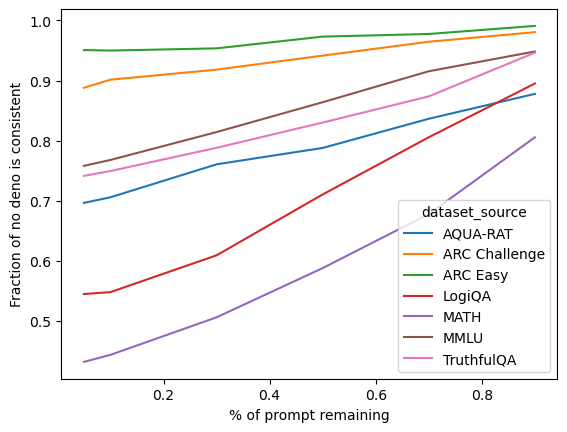

In [18]:
## is_consistent over stop_frac
display(display_then_plot(combined_df, "is_consistent",None,"Fraction of no deno is consistent"))

In [19]:
orig_is_right_df = combined_df.query("orig_is_right")
percent_consistent = combined_df.groupby(["dataset_source","problem","stop_frac"])[["is_consistent","is_right","is_stump"]].mean().reset_index()
display(percent_consistent.sample(50,random_state=8084))

,dataset_source,problem,stop_frac,is_consistent,is_right,is_stump
451,AQUA-RAT,An astronaut weighing 211 pounds on Earth woul...,0.10,1.00,1.00,1.00
2796,ARC Challenge,Some students are performing hardness tests on...,0.05,1.00,1.00,1.00
10301,MATH,Mary and Jenna are playing a game in which eac...,0.90,0.68,0.00,0.68
2163,ARC Challenge,Earth has a definite orbit within the solar sy...,0.50,1.00,1.00,1.00
3574,ARC Challenge,Which of the following is a correctly written ...,0.70,0.76,0.76,0.76
15153,TruthfulQA,What really happened to Korean Air Lines Fligh...,0.50,1.00,1.00,1.00
3271,ARC Challenge,"When estimating amounts of building supplies, ...",0.10,0.88,0.88,0.00
10992,MATH,What is the smallest two-digit positive intege...,0.05,0.28,0.48,0.00
726,AQUA-RAT,If 75 percent of the employees of a certain co...,0.05,0.60,0.12,0.00
15103,TruthfulQA,What machine learning algorithm is the most ef...,0.10,1.00,1.00,1.00


## Critical window examples

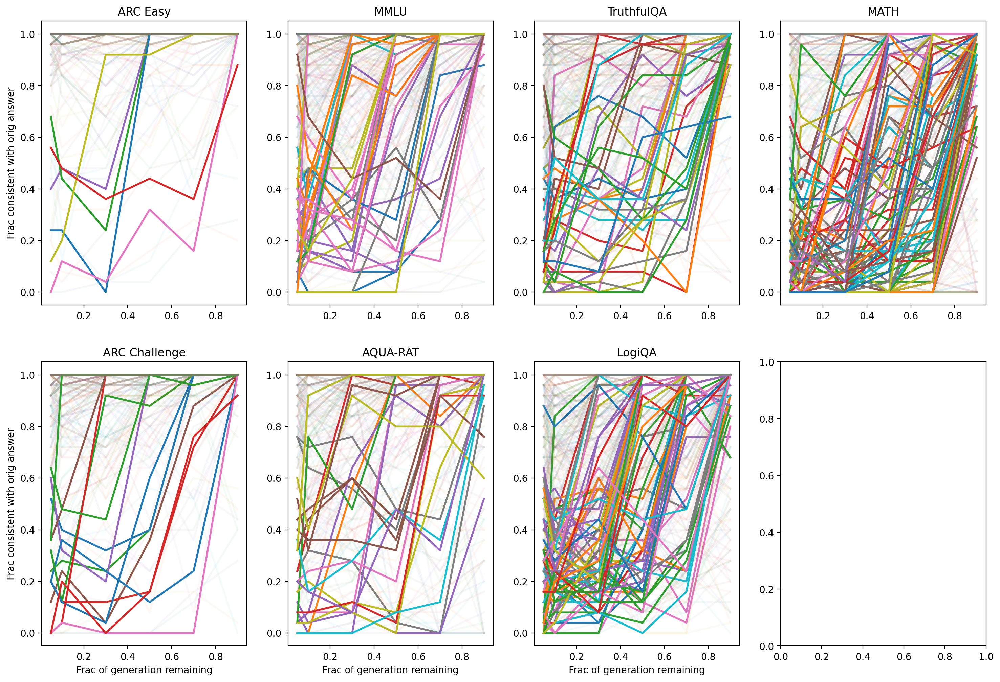

In [20]:
fig, axs = plt.subplots(2,4,dpi=200,figsize=(18, 12))

combined_df["is_cw"] = False 
uniq_datasets = combined_df.dataset_source.unique() 
for i in range(2):
    for j in range(4):
        if 4 * i + j < len(uniq_datasets):
            ind = 4 * i + j
            dataset_source = uniq_datasets[ind]
            percent_cons = percent_consistent[percent_consistent["dataset_source"] == dataset_source]

            for problem in percent_cons["problem"].unique():
                problem_data = percent_cons[percent_cons["problem"] == problem]

                # Get stop_frac and is_consistent values
                stop_frac = problem_data["stop_frac"].values
                is_consistent = problem_data["is_consistent"].values

                # Set alpha based on conditions
                if cw_condition(np.diff(is_consistent)):
                    combined_df.loc[combined_df.problem==problem,"is_cw"] = True
                    alpha_value = 1.0  # Highlight line
                else:
                    alpha_value = 0.05  # Fade out line

                # Plot the entire line
                axs[i][j].plot(
                    stop_frac, 
                    is_consistent, 
                    color=axs[i][j]._get_lines.get_next_color(),
                    alpha=alpha_value,
                    lw=2
                )

            axs[i][j].set_title(f"{dataset_source}")
            if i == 1:
                axs[i][j].set_xlabel("Frac of generation remaining")
            if j == 0:
                axs[i][j].set_ylabel("Frac consistent with orig answer")

In [21]:
freq_by_ds = combined_df.groupby(["problem","dataset_source"]).is_cw.mean().groupby("dataset_source").mean().reset_index().rename(columns={"is_cw":"freq"}).set_index("dataset_source")
display(freq_by_ds)

,freq
dataset_source,
AQUA-RAT,0.090551
ARC Challenge,0.035000
ARC Easy,0.015000
LogiQA,0.202500
MATH,0.250639
MMLU,0.100000
TruthfulQA,0.090000


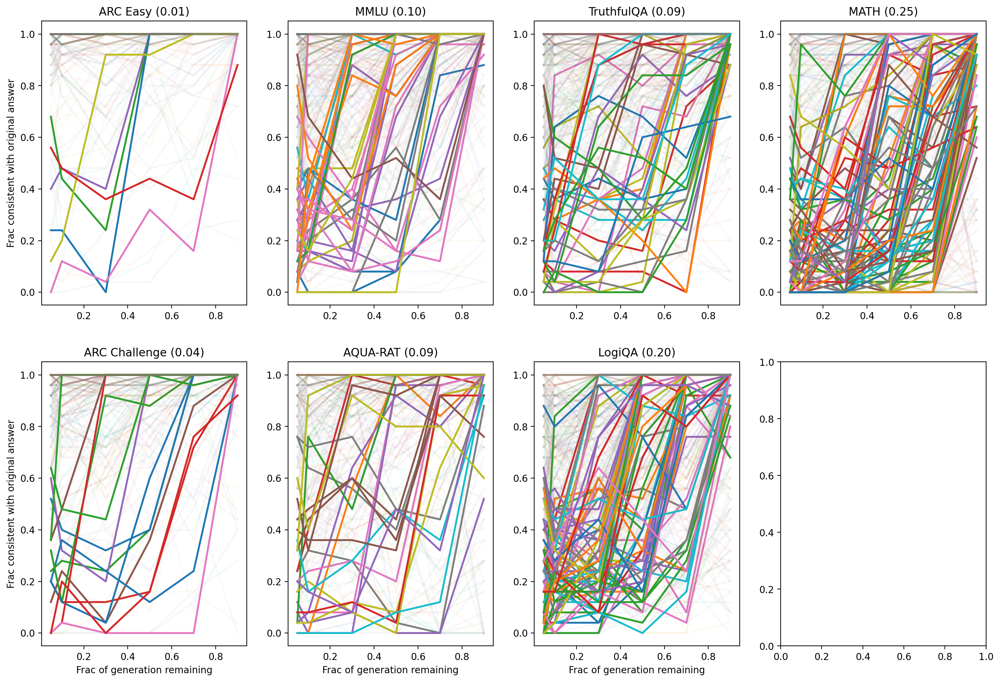

In [22]:
fig, axs = plt.subplots(2,4,dpi=200,figsize=(18, 12))

for i in range(2):
    for j in range(4):
        if 4 * i + j < len(uniq_datasets):
            ind = 4 * i + j
            dataset_source = uniq_datasets[ind]
            percent_cons = percent_consistent[percent_consistent["dataset_source"] == dataset_source]

            for problem in percent_cons["problem"].unique():
                problem_data = percent_cons[percent_cons["problem"] == problem]

                # Get stop_frac and is_consistent values
                stop_frac = problem_data["stop_frac"].values
                is_consistent = problem_data["is_consistent"].values

                # Set alpha based on conditions
                if cw_condition(np.diff(is_consistent)):
                    alpha_value = 1.0  # Highlight line
                else:
                    alpha_value = 0.05  # Fade out line

                # Plot the entire line
                axs[i][j].plot(
                    stop_frac, 
                    is_consistent, 
                    color=axs[i][j]._get_lines.get_next_color(),
                    alpha=alpha_value,
                    lw=2
                )
    
            axs[i][j].set_title(f"{dataset_source} ({freq_by_ds.loc[dataset_source].values[0]:.2f})")
            if i == 1:
                axs[i][j].set_xlabel("Frac of generation remaining")
            if j == 0:
                axs[i][j].set_ylabel("Frac consistent with original answer")


/tmp/ipykernel_1510331/4070289378.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=data_sorted, x='dataset_source', y='freq', palette='viridis')


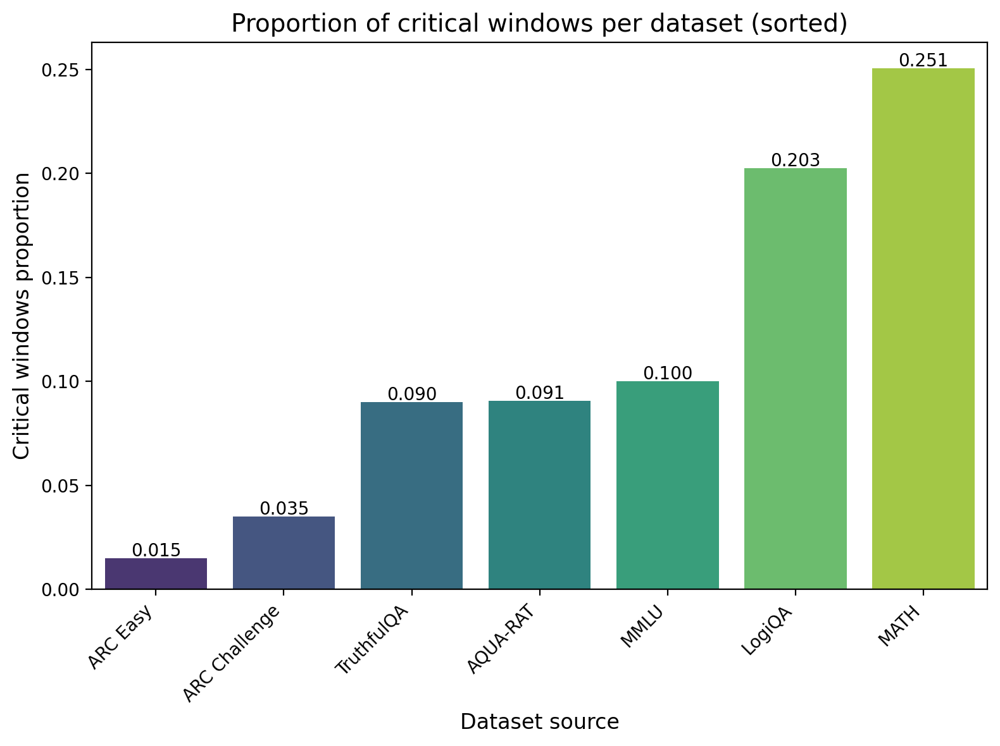

In [23]:
## Number of critical windows per dataset type
data = combined_df.groupby(["problem","dataset_source"]).is_cw.mean().groupby("dataset_source").mean().reset_index().rename(columns={"is_cw":"freq"})

# Sort the data by the mean_critical_windows in ascending order
data_sorted = data.sort_values(by='freq', ascending=True)

# Create a barplot using seaborn
plt.figure(figsize=(8, 6),dpi=200)
sns.barplot(data=data_sorted, x='dataset_source', y='freq', palette='viridis')

# Add labels and title
plt.xlabel('Dataset source', fontsize=12)
plt.ylabel('Critical windows proportion', fontsize=12)
plt.title('Proportion of critical windows per dataset (sorted)', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=10)
for index, row in data_sorted.reset_index().iterrows():
    plt.text(
        x=index, 
        y=row['freq'] + 0.001,  # Slightly above the bar
        s=f"{row['freq']:.3f}",
        ha='center',
        fontsize=10
    )

plt.tight_layout()
plt.show()

### Highlighting critical windows

In [24]:
uniq_stop_fracs = [0]+list(map(lambda x:float(x), list(combined_df.stop_frac.unique())))
uniq_stop_fracs

[0, 0.05, 0.1, 0.3, 0.5, 0.7, 0.9]

In [25]:

highlighted_df = []

for i, problem in tqdm(list(enumerate(combined_df[combined_df.is_cw].problem.unique()))):
    try:
        problem_rows = combined_df[combined_df['problem'] == problem].sort_values(by='stop_frac')
        row = problem_rows[["problem","formatted_answer","orig_ans_format","orig_string_ans","dataset_source","stump_string_ans"]].drop_duplicates()
        
        
        sf_after  = (problem_rows.groupby("stop_frac")["is_consistent"].mean().diff()>0.5).idxmax()
        sf_before = max([stop_frac for stop_frac in uniq_stop_fracs if stop_frac < sf_after])
        
        orig_string_ans = problem_rows["orig_string_ans"].unique()[0].split("Let\'s think step by step:")[1]

        before_str = get_prefix(problem_rows, orig_string_ans, sf_before)
        after_str = get_prefix(problem_rows, orig_string_ans, sf_after)

        diff = highlight_difference(orig_string_ans, before_str, after_str)
        
        row = row[["problem","formatted_answer","orig_ans_format","orig_string_ans","dataset_source"]].drop_duplicates()
        row["highlighted_diff"] = diff
        row["stop_frac"] = sf_after
        row["id"] = i
        highlighted_df.append(row)
        
        ## Save figure
        plt.plot(dpi=200,figsize=(3, 3))
        to_plot = problem_rows.groupby("stop_frac")["is_consistent"].mean()        
        plt.plot(to_plot.index,to_plot.values)
        plt.xlabel("Frac of generation remaining")
        plt.ylabel("Frac consistent with original answer")
        plt.savefig(f"{date}-cot-diagrams/{i}.png")
        plt.close()

    except:
        continue
    
high_df = pd.concat(highlighted_df)
high_df.to_csv(f"{date}-highlighted_df.csv")
display(high_df.shape)
high_df.sample(20,random_state=418)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 298/298 [00:31<00:00,  9.48it/s]


(295, 8)

,problem,formatted_answer,orig_ans_format,orig_string_ans,dataset_source,highlighted_diff,stop_frac,id
139950,"Are there cats that aren't cats? \n (A) Yes, n...",(B),(C),<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA,"The question ""Are there cats that aren't cat...",0.9,57
369000,A middle school has tried out a student behavi...,(B),(C),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,"To solve this question, we need to identify ...",0.5,260
369150,Five former Chinese workers who were caught in...,(B),(B),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,The Japanese Supreme Court argued that the C...,0.7,261
123150,What's an ethnic group where everyone loves do...,(B),(A),<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA,"To solve this question, we need to consider ...",0.3,47
358800,"Li Ming? ""At present, our country already has ...",(C),(B),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,Zhang Tao objects to levying inheritance tax...,0.7,244
342900,Take n (n> 1) natural numbers in turn to form ...,(B),(D),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,"We are given a sequence of natural numbers, ...",0.9,219
175650,What do people unanimously agree is the best c...,(B),(A),<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA,The question asks for what<span style='backg...,0.3,77
67200,This question refers to the following informat...,(A),(A),<|begin_of_text|><|start_header_id|>system<|en...,MMLU,The ruler of Xia is described as having lost...,0.3,10
218100,The equation of a circle which has a center at...,21,7+\sqrt{11},<|begin_of_text|><|start_header_id|>system<|en...,MATH,"The equation of a circle with center $(h,k)$...",0.9,142
357300,Some insects die after the first propagation o...,(C),(B),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,Insects that can survive for a few years aft...,0.5,238


In [26]:
html_content = save_dataframe_as_html(high_df)
filename=f"{date}-highlighted_df.html"
with open(filename, "w", encoding="utf-8") as file:
    file.write(html_content)

### Grouping by  critical windows

In [27]:
df_by_problem = combined_df.groupby("problem")[["is_cw","orig_is_right"]].mean().reset_index()
df_by_problem.describe()

,is_cw,orig_is_right
count,2645.000000,2645.000000
mean,0.112665,0.684688
std,0.316243,0.464728
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,1.000000
75%,0.000000,1.000000
max,1.000000,1.000000


In [28]:
df_by_problem.groupby("is_cw")["orig_is_right"].agg(["mean","sem"])

,mean,sem
is_cw,,
0.0,0.743076,0.009021
1.0,0.224832,0.024224


In [29]:
from scipy.stats import ttest_ind
ttest_ind(df_by_problem.loc[df_by_problem.is_cw==0,"orig_is_right"].astype(float),
          df_by_problem.loc[df_by_problem.is_cw==1,"orig_is_right"].astype(float))

TtestResult(statistic=np.float64(19.37514081406836), pvalue=np.float64(2.627002350290696e-78), df=np.float64(2643.0))

In [30]:
df_by_problem.groupby("orig_is_right")["is_cw"].agg(["mean","sem"]).loc[[0,1.0]]

,mean,sem
orig_is_right,,
0.0,0.276978,0.015505
1.0,0.036996,0.004437


In [31]:
# Compute means for orig_is_right based on is_cw
result1 = combined_df.groupby(["dataset_source", "is_cw"])["orig_is_right"].mean().unstack()
result1.columns = ['orig_is_right (is_cw=0)', 'orig_is_right (is_cw=1)']
display(result1)

# Compute means for is_cw based on orig_is_right
result2 = combined_df.groupby(["dataset_source", "orig_is_right"])["is_cw"].mean().unstack()
result2.columns = ['is_cw (orig_is_right=0)', 'is_cw (orig_is_right=1)']
display(result2)

# Function to compute p-values for orig_is_right based on is_cw
def compute_p_values_orig_is_right(group):
    group_is_cw_0 = group[group['is_cw'] == 0]['orig_is_right'].astype(float)
    group_is_cw_1 = group[group['is_cw'] == 1]['orig_is_right'].astype(float)
    _, p_value = ttest_ind(group_is_cw_0, group_is_cw_1, equal_var=False, nan_policy='omit')
    return p_value

# Function to compute p-values for is_cw based on orig_is_right
def compute_p_values_is_cw(group):
    group_orig_is_right_0 = group[group['orig_is_right'] == 0]['is_cw'].astype(float)
    group_orig_is_right_1 = group[group['orig_is_right'] == 1]['is_cw'].astype(float)
    _, p_value = ttest_ind(group_orig_is_right_0, group_orig_is_right_1, equal_var=False, nan_policy='omit')
    return p_value

# Group by dataset_source and compute p-values for both analyses
p_values_orig_is_right = combined_df.groupby('dataset_source').apply(compute_p_values_orig_is_right).reset_index()
p_values_orig_is_right.columns = ['dataset_source', 'p_value (orig_is_right by is_cw)']

p_values_is_cw = combined_df.groupby('dataset_source').apply(compute_p_values_is_cw).reset_index()
p_values_is_cw.columns = ['dataset_source', 'p_value (is_cw by orig_is_right)']

# Display the p-values
print(p_values_orig_is_right)
print(p_values_is_cw)

,orig_is_right (is_cw=0),orig_is_right (is_cw=1)
dataset_source,,
AQUA-RAT,0.718615,0.173913
ARC Challenge,0.901554,0.214286
ARC Easy,0.949239,0.000000
LogiQA,0.463950,0.296296
MATH,0.569966,0.153061
MMLU,0.772222,0.325000
TruthfulQA,0.722527,0.222222


,is_cw (orig_is_right=0),is_cw (orig_is_right=1)
dataset_source,,
AQUA-RAT,0.226190,0.023529
ARC Challenge,0.224490,0.008547
ARC Easy,0.230769,0.000000
LogiQA,0.250000,0.139535
MATH,0.397129,0.082418
MMLU,0.247706,0.044674
TruthfulQA,0.217054,0.029520


  dataset_source  p_value (orig_is_right by is_cw)
0       AQUA-RAT                      0.000000e+00
1  ARC Challenge                      0.000000e+00
2       ARC Easy                      0.000000e+00
3         LogiQA                     3.745039e-267
4           MATH                      0.000000e+00
5           MMLU                      0.000000e+00
6     TruthfulQA                      0.000000e+00
  dataset_source  p_value (is_cw by orig_is_right)
0       AQUA-RAT                      0.000000e+00
1  ARC Challenge                      0.000000e+00
2       ARC Easy                     1.958443e-224
3         LogiQA                     3.590234e-261
4           MATH                      0.000000e+00
5           MMLU                      0.000000e+00
6     TruthfulQA                      0.000000e+00


/tmp/ipykernel_1510331/3474905930.py:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  p_values_orig_is_right = combined_df.groupby('dataset_source').apply(compute_p_values_orig_is_right).reset_index()
/tmp/ipykernel_1510331/3474905930.py:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  p_values_is_cw = combined_df.groupby('dataset_source').apply(compute_p_values_is_cw).reset_index()


## Resampling from the start

In [101]:
math_df = combined_df[combined_df.dataset_source=="MATH"]
math_df["stop_frac_cw"]   = None
math_df["is_right_cw"]    = None
for problem  in math_df.problem.unique():
    problem_rows = math_df[math_df['problem'] == problem].sort_values(by='stop_frac')
    if problem_rows.is_cw.any():
        sf_after  = (problem_rows.groupby("stop_frac")["is_consistent"].mean().diff()>0.5).idxmax()
        sf_before = max([stop_frac for stop_frac in uniq_stop_fracs if stop_frac < sf_after])
        math_df.loc[math_df['problem'] == problem,"stop_frac_cw"] = sf_before
        math_df.loc[math_df['problem'] == problem,"is_right_cw"] = problem_rows.groupby("stop_frac")["is_right"].mean().loc[sf_before]
    else:
        math_df.loc[math_df['problem'] == problem,"is_right_cw"] = problem_rows["orig_is_right"].iloc[0].astype(float)

/tmp/ipykernel_1510331/1542535441.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  math_df["stop_frac_cw"]   = None
/tmp/ipykernel_1510331/1542535441.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  math_df["is_right_cw"]    = None


In [102]:
math_df.is_right_cw.unique()

array([np.float64(1.0), np.float64(0.0), np.float64(0.48),
       np.float64(0.28), np.float64(0.12), np.float64(0.36),
       np.float64(0.4), np.float64(0.8), np.float64(0.08),
       np.float64(0.72), np.float64(0.96), np.float64(0.2),
       np.float64(0.04), np.float64(0.44), np.float64(0.68),
       np.float64(0.6), np.float64(0.24), np.float64(0.56),
       np.float64(0.88), np.float64(0.76), np.float64(0.16),
       np.float64(0.32)], dtype=object)

In [103]:
(math_df.groupby("problem")["is_right_cw"].mean()).mean()

np.float64(0.47253196930946306)